In [1]:
import pandas as pd
import numpy as np

import os
import sys

# librosa is a Python library for analyzing audio and music. It can be used to extract the data from the audio files we will see it later.
import librosa
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# to play the audio files
from IPython.display import Audio

import keras
from keras.callbacks import ReduceLROnPlateau
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization
from keras.utils import np_utils, to_categorical
from keras.callbacks import ModelCheckpoint

import tensorflow as tf
RANDOM_SEED_CONSTANT = 42  # FOR_REPRODUCIBILITY
tf.random.set_seed(RANDOM_SEED_CONSTANT)

import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning) 

In [2]:
call_centre = "D:/call recording/call recording/"

In [3]:
call_dir_list = os.listdir(call_centre)

file_emotion, file_path = [], []

for dir in call_dir_list:
    
    call = os.listdir(call_centre + dir)
    for file in call:
        part = file.split('.')[0]
        part = part.split('_')
        file_emotion.append(part[-2])
        file_path.append(call_centre + dir + '/' + file)
        
emotion_df = pd.DataFrame(file_emotion, columns=['Emotions'])
path_df = pd.DataFrame(file_path, columns=['Path'])

call_centre_df = pd.concat((emotion_df, path_df), axis = 1)
call_centre_df.head()

,Emotions,Path
0,Negative,D:/call recording/call recording/call_01/20247...
1,Negative,D:/call recording/call recording/call_01/amit ...
2,Negative,D:/call recording/call recording/call_01/Bhava...
3,Negative,D:/call recording/call recording/call_01/Divya...
4,Negative,D:/call recording/call recording/call_01/Haide...


In [4]:
data_path = call_centre_df
data_path.to_csv("data_path.csv", index = False)
data_path.head()

,Emotions,Path
0,Negative,D:/call recording/call recording/call_01/20247...
1,Negative,D:/call recording/call recording/call_01/amit ...
2,Negative,D:/call recording/call recording/call_01/Bhava...
3,Negative,D:/call recording/call recording/call_01/Divya...
4,Negative,D:/call recording/call recording/call_01/Haide...


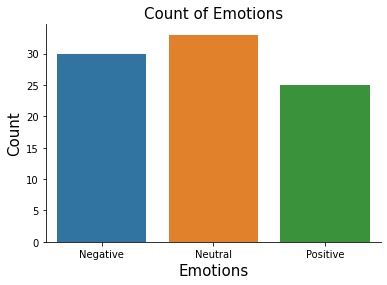

In [5]:
plt.title('Count of Emotions', size = 15)
sns.countplot(data_path.Emotions)
plt.ylabel('Count', size = 15)
plt.xlabel('Emotions', size = 15)
sns.despine(top = True, right = True)
plt.show()

In [6]:
def create_waveplot(data, sr, e):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio with {} emotion'.format(e), size=15)
    librosa.display.waveshow(data, sr=sr)
    plt.show()

def create_spectrogram(data, sr, e):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12, 3))
    plt.title('Spectrogram for audio with {} emotion'.format(e), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')   
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()

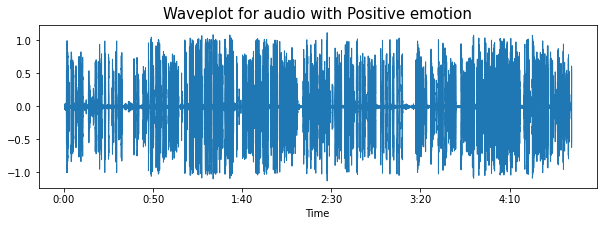

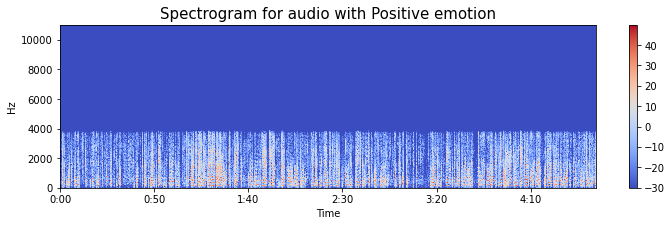

In [7]:
# Similar with other emotions
emotion='Positive'
path = np.array(data_path.Path[data_path.Emotions==emotion])[3]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

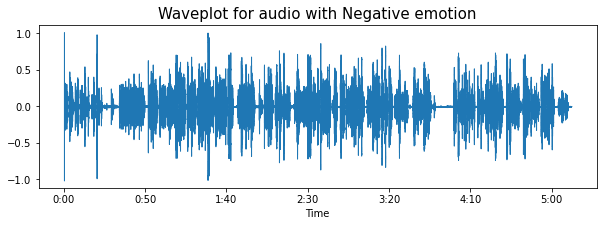

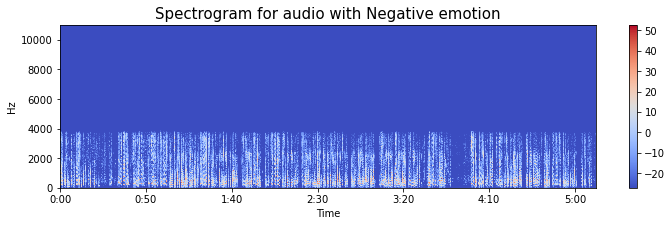

In [8]:
# Similar with other emotions
emotion='Negative'
path = np.array(data_path.Path[data_path.Emotions==emotion])[2]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

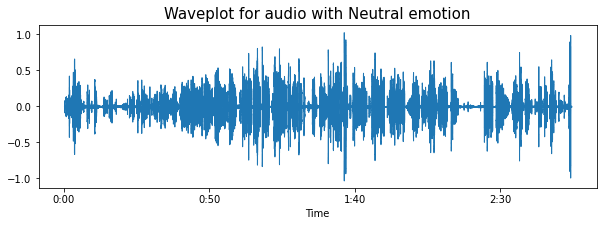

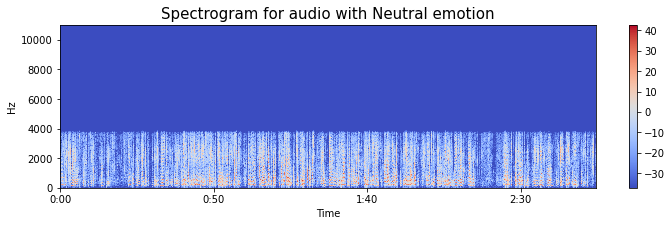

In [9]:
# Similar with other emotions
emotion='Neutral'
path = np.array(data_path.Path[data_path.Emotions==emotion])[4]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

In [8]:
def noise(data):
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate)

def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)

def pitch(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sampling_rate, pitch_factor)

def extract_features(data, sample_rate):
    # Zero Crossing Rate
    result = np.array([])
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    result=np.hstack((result, zcr)) # stacking horizontally

    # Chroma_stft
    stft = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(y = data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, chroma_stft)) # stacking horizontally

    # MFCC
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mfcc)) # stacking horizontally

    # Root Mean Square Value
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, rms)) # stacking horizontally

    # MelSpectogram
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mel)) # stacking horizontally
    
    # Spectral Centroid
    spc = np.mean(librosa.feature.spectral_centroid(y = data, sr = sample_rate).T, axis = 0)
    result = np.hstack((result, spc))
    
    # spectral Roll-off
    soff = np.mean(librosa.feature.spectral_rolloff(y = data, sr = sample_rate).T, axis = 0)
    result = np.hstack((result, soff))
    
    # Poly Feature
    pof = np.mean(librosa.feature.poly_features(y = data, sr = sample_rate).T, axis = 0)
    result = np.hstack((result, pof))
    
    # Tonnetz
    ton = np.mean(librosa.feature.tonnetz(y = data, sr = sample_rate).T, axis = 0)
    result = np.hstack((result, ton))
    
    return result

def get_features(path):
    data, sample_rate = librosa.load(path, duration=2.5, offset=0.6) # audio selected from 0.6s to 0.6s+2.5s
    
    # without augmentation
    res1 = extract_features(data, sample_rate)
    result = np.array(res1)
    
    # data with noise
    noise_data = noise(data)
    res2 = extract_features(noise_data, sample_rate)
    result = np.vstack((result, res2)) # stacking vertically
    
    # data with stretching and pitching
    new_data = stretch(data)
    data_stretch_pitch = pitch(new_data, sample_rate)
    res3 = extract_features(data_stretch_pitch, sample_rate)
    result = np.vstack((result, res3)) # stacking vertically
    
    return result

In [9]:
X, Y = [], []
for path, emotion in zip(data_path.Path, data_path.Emotions):
    feature = get_features(path)
    for ele in feature:
        X.append(ele)
        # appending emotion 3 times as we have made 3 augmentation techniques on each audio file.
        Y.append(emotion)

In [10]:
len(X), len(Y), data_path.Path.shape

(264, 264, (88,))

In [11]:
Features = pd.DataFrame(X)
Features['labels'] = Y
Features.to_csv('features_with_augmentation.csv', index=False)
Features

,0,1,2,3,4,5,6,7,8,9,...,163,164,165,166,167,168,169,170,171,labels
0,0.113105,0.491451,0.332788,0.339030,0.345003,0.386398,0.374658,0.289132,0.276649,0.312268,...,2834.407552,-0.000109,0.870542,0.014648,0.025725,0.015309,0.049923,-0.005967,0.004149,Negative
1,0.223149,0.426391,0.425805,0.418725,0.441560,0.423404,0.353164,0.340969,0.372111,0.382548,...,6319.097900,-0.000101,0.890618,0.014512,0.024574,0.014273,0.039289,-0.004429,0.004903,Negative
2,0.126429,0.377839,0.445912,0.314745,0.308315,0.367020,0.380882,0.335695,0.226317,0.265398,...,3023.022461,-0.000050,0.401661,-0.023443,0.012062,-0.054289,0.042554,0.006926,0.005314,Negative
3,0.072650,0.262882,0.295382,0.500935,0.437144,0.245269,0.196824,0.367382,0.355332,0.251066,...,1975.771077,-0.000254,1.963567,0.062457,0.018365,-0.003304,-0.140180,-0.015566,0.022728,Negative
4,0.193047,0.301591,0.415105,0.598049,0.387706,0.270039,0.290290,0.445564,0.316420,0.353101,...,5294.476318,-0.000242,1.995734,0.060066,0.015410,-0.011804,-0.131014,-0.017309,0.019190,Negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,0.315095,0.463691,0.550863,0.550174,0.578387,0.548491,0.578307,0.502679,0.400623,0.369468,...,8293.273926,-0.000225,2.595125,-0.007272,0.005790,-0.031469,-0.005409,-0.004376,0.000988,Positive
260,0.112807,0.307072,0.390350,0.372732,0.464509,0.439761,0.490404,0.431685,0.319819,0.241404,...,2871.492513,-0.000148,1.188406,-0.011076,-0.008675,-0.001204,-0.022004,0.003040,0.005098,Positive
261,0.113200,0.212660,0.220802,0.325375,0.405974,0.336148,0.320564,0.358411,0.408210,0.518538,...,2468.741862,-0.000067,0.528585,-0.002385,-0.004522,0.000060,0.041442,-0.012864,0.000767,Positive
262,0.363666,0.477790,0.451257,0.493446,0.577203,0.539810,0.512342,0.500071,0.551445,0.608701,...,8868.489583,-0.000048,0.732187,-0.002703,-0.005775,0.011955,0.019754,-0.009044,-0.004706,Positive


In [12]:
X = Features.iloc[: ,:-1].values
Y = Features['labels'].values

# As this is a multiclass classification problem onehotencoding our Y.
encoder = OneHotEncoder()
Y = encoder.fit_transform(np.array(Y).reshape(-1,1)).toarray()

# splitting data
x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state=0, shuffle=True)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((198, 172), (198, 3), (66, 172), (66, 3))

In [13]:
# scaling our data with sklearn's Standard scaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((198, 172), (198, 3), (66, 172), (66, 3))

In [14]:
# making our data compatible to model.
x_train = np.expand_dims(x_train, axis=2)
x_test = np.expand_dims(x_test, axis=2)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((198, 172, 1), (198, 3), (66, 172, 1), (66, 3))

In [15]:
model=Sequential()
model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu', input_shape=(x_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(Conv1D(128, kernel_size=5, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))
model.add(Dropout(0.2))

model.add(Conv1D(64, kernel_size=5, strides=1, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(Flatten())
model.add(Dense(units=32, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(units=3, activation='softmax'))
model.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = ['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 172, 256)          1536      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 86, 256)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 86, 256)           327936    
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 43, 256)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 43, 128)           163968    
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 22, 128)           0         
_________________________________________________________________
dropout (Dropout)            (None, 22, 128)           0

In [16]:
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
history=model.fit(x_train, y_train, epochs=40, validation_data=(x_test, y_test), callbacks=[rlrp])

Epoch 1/40
7/7 [==============================] - 1s 123ms/step - loss: 1.1318 - accuracy: 0.3384 - val_loss: 1.0557 - val_accuracy: 0.4545
Epoch 2/40
7/7 [==============================] - 1s 87ms/step - loss: 1.0894 - accuracy: 0.3889 - val_loss: 1.0519 - val_accuracy: 0.4697
Epoch 3/40
7/7 [==============================] - 0s 71ms/step - loss: 1.0768 - accuracy: 0.3737 - val_loss: 1.0542 - val_accuracy: 0.4697
Epoch 4/40
7/7 [==============================] - 0s 70ms/step - loss: 1.0741 - accuracy: 0.4040 - val_loss: 1.0402 - val_accuracy: 0.5000
Epoch 5/40
7/7 [==============================] - 1s 83ms/step - loss: 1.0607 - accuracy: 0.4394 - val_loss: 1.0270 - val_accuracy: 0.5000
Epoch 6/40
7/7 [==============================] - 1s 80ms/step - loss: 1.0480 - accuracy: 0.4343 - val_loss: 1.0280 - val_accuracy: 0.4848
Epoch 7/40
7/7 [==============================] - 1s 82ms/step - loss: 1.0526 - accuracy: 0.4545 - val_loss: 0.9957 - val_accuracy: 0.4848
Epoch 8/40
7/7 [==========

3/3 [==============================] - 0s 8ms/step - loss: 0.5356 - accuracy: 0.8030
Accuracy of our model on test data :  80.30303120613098 %


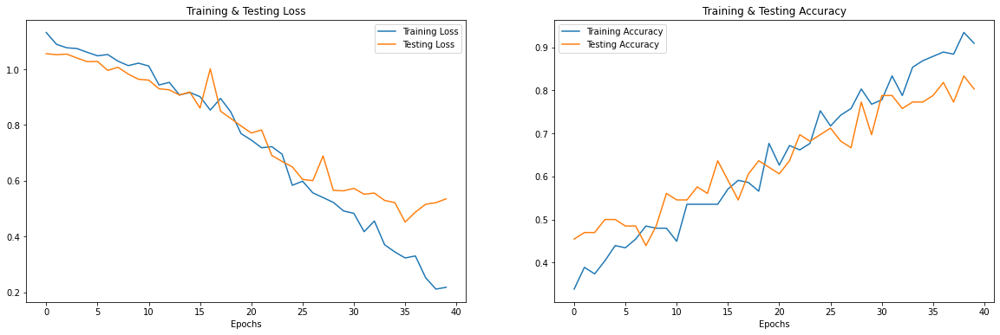

In [17]:
print("Accuracy of our model on test data : " , model.evaluate(x_test,y_test)[1]*100 , "%")

epochs = [i for i in range(40)]
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
test_acc = history.history['val_accuracy']
test_loss = history.history['val_loss']

fig.set_size_inches(20,6)
ax[0].plot(epochs , train_loss , label = 'Training Loss')
ax[0].plot(epochs , test_loss , label = 'Testing Loss')
ax[0].set_title('Training & Testing Loss')
ax[0].legend()
ax[0].set_xlabel("Epochs")

ax[1].plot(epochs , train_acc , label = 'Training Accuracy')
ax[1].plot(epochs , test_acc , label = 'Testing Accuracy')
ax[1].set_title('Training & Testing Accuracy')
ax[1].legend()
ax[1].set_xlabel("Epochs")
plt.show()

In [18]:
# predicting on test data.
pred_test = model.predict(x_test)
y_pred = encoder.inverse_transform(pred_test)

y_test = encoder.inverse_transform(y_test)

In [19]:
df = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels'])
df['Predicted Labels'] = y_pred.flatten()
df['Actual Labels'] = y_test.flatten()

df.head(40)

,Predicted Labels,Actual Labels
0,Positive,Positive
1,Neutral,Neutral
2,Positive,Positive
3,Negative,Negative
4,Negative,Negative
5,Negative,Negative
6,Negative,Negative
7,Positive,Positive
8,Positive,Positive
9,Positive,Positive


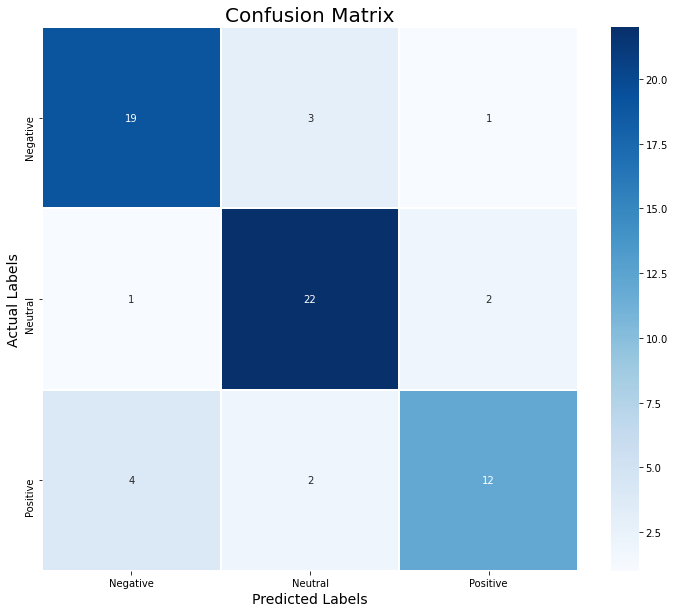

In [20]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize = (12, 10))
cm = pd.DataFrame(cm , index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])
sns.heatmap(cm, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='')
plt.title('Confusion Matrix', size=20)
plt.xlabel('Predicted Labels', size=14)
plt.ylabel('Actual Labels', size=14)
plt.show()

In [21]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

    Negative       0.79      0.83      0.81        23
     Neutral       0.81      0.88      0.85        25
    Positive       0.80      0.67      0.73        18

    accuracy                           0.80        66
   macro avg       0.80      0.79      0.79        66
weighted avg       0.80      0.80      0.80        66

